# Laboratory 1
    Authors:
    - Roberto Pérez 
    - Arturo Bringas
    - Edgar Bazo
    - Mariana Lugo

# Imports

#### Python libraries

In [43]:
import sys
import pandas as pd
import numpy as np
import re
import unicodedata
import seaborn as sns
from pandas_profiling import ProfileReport
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff

#### Acillary modules

In [127]:
%load_ext autoreload
%autoreload 2

from utils.lab1_funcs import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Loading data

Data downloaded from -> https://datos.cdmx.gob.mx/explore/dataset/consumo-agua/export/

In [143]:
df = pd.read_csv("data/consumo-agua.csv")

In [144]:
df

,Geo Point,Geo Shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des
0,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",159.72,2019,Gustavo A. Madero,42.566364,468.23,GUSTAVO A. MADERO,7 DE NOVIEMBRE,53.240000,631.00,42.066667,3.050000,3,3.05,57250,ALTO
1,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,35.936667,107.81,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,115.13,28.782500,7.320000,3,7.32,57253,MEDIO
2,"19.4557195871,-99.1135822797","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,24.586000,122.93,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,197.96,32.993333,75.030000,3,75.03,57255,POPULAR
3,"19.4596467168,-99.1044693641","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,0.000000,0.00,GUSTAVO A. MADERO,NUEVA TENOCHTITLAN,0.000000,253.53,84.510000,84.510000,3,253.53,57267,BAJO
4,"19.4741606185,-99.1467497317","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",56.72,2019,Azcapotzalco,67.436250,539.49,AZCAPOTZALCO,PROHOGAR,56.720000,839.35,76.304545,121.570000,3,243.14,57330,BAJO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71097,"19.4485642979,-99.1399395353","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",NaN,2019,Cuauhtémoc,20.053112,3930.41,CUAUHTEMOC,GUERRERO,NaN,4286.28,19.307568,13.687308,1,355.87,233,BAJO
71098,"19.4493393649,-99.1457191092","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",71.30,2019,Cuauhtémoc,21.126615,9549.24,CUAUHTEMOC,GUERRERO,35.650001,9796.12,20.976702,13.506923,1,175.59,238,POPULAR
71099,"19.4483923147,-99.1459300721","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",759.16,2019,Cuauhtémoc,27.527778,4707.25,CUAUHTEMOC,GUERRERO,94.894999,5692.81,29.344381,15.093334,1,226.40,239,BAJO
71100,"19.4475868325,-99.1425094385","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",402.65,2019,Cuauhtémoc,30.605000,550.89,CUAUHTEMOC,GUERRERO,100.662498,963.15,41.876087,9.610000,1,9.61,244,BAJO


# Data profiling

## ¿Cuántas variables tenemos?

In [ ]:
count_vars(df)

## ¿Cuántas observaciones tenemos?

In [ ]:
count_obs(df)

## ¿Cuántas observaciones únicas tenemos por variable?

In [ ]:
count_unique_obs(df)

## ¿Cuántas variables numéricas tenemos?

Tenemos 8 variables numéricas

In [ ]:
vars_num = [
    "consumo_total_mixto",
    "consumo_prom_dom",
    "consumo_total_dom",
    "consumo_prom_mixto",
    "consumo_total",
    "consumo_prom",
    "consumo_prom_no_dom",
    "consumo_total_no_dom"
]

In [ ]:
count_type_vars(vars_num, "numerica")

## ¿Cuántas variables de fecha tenemos?
- Para efectos de este ejercicio, no hay ninguna variable de tipo fecha, o que consideremos de fecha.

## ¿Cuántas variables categóricas tenemos?

In [ ]:
cat_vars = [
    "anio",
    "nomgeo",
    "alcaldia",
    "colonia",
    "bimestre",
    "indice_des",
]

In [ ]:
count_type_vars(cat_vars, "categórica")

## ¿Cuántas variables de texto tenemos?
- Para efectos de este ejercicio, no hay ninguna variable de tipo texto, o que consideremos de texto. Se podría considerar a la variable `gid` como un identificador de texto.

In [ ]:
vars_text = ["gid"]

In [ ]:
count_type_vars(vars_text, "texto")

## Generea el profiling de cada variable

### Numeric data profiling

- [x] Tipo de dato: float, integer
- [x] Número de observaciones
- [x] Mean
- [x] Desviación estándar
- [x] Cuartiles: 25%, 50%, 75%
- [x] Valor máximo
- [x] Valor mínimo
- [x] Número de observaciones únicos
- [x] Top 5 observaciones repetidas
- [x] Número de observaciones con valores faltantes
- [x] ¿Hay redondeos? -> Se observa que los datos de los totales en el consumo (dom, mixto, no_dom) están a dos decimales desde la fuente. Los datos de los promedios del consumo (dom, mixto, no_dom) tienen seis decimales desde la fuente.  No podemos asegurar que los datos, tanto de los totales, como de los promedios,  están redondeados.

#### Función para perfil de datos numérico

In [ ]:
## Data profiling compacted in function
data_profiling_numeric(df, vars_num)

### Categoric data profiling

**Profiling: Variables categóricas**

- [x] Número de categorías
- [x] Valor de las categorías
- [x] Moda
- [x] Valores faltantes
- [x] Número de observaciones con valores faltantes
- [x] Proporción de observaciones por categoría
- [x] Top 1, top 2, top 3 (moda 1, moda 2, moda 3)
- [x] Faltas de ortografía ?

In [ ]:
#data profiling function
data_profiling_categ(df,cat_vars)

### Additional data profiling

- En este ejercicio particular no se contó con variables del siguiente tipo para hacer el profiling:
    - Imágen
    - Audio

## ¿Qué conocemos ahora de este set de datos por variable?

1. ¿Cuántas alcadías tienes?
    - Hay un total de 16 alcaldías

2. ¿Cuántos `nomgeo` tienes?
    - Hay un total de 17 nomgeo

3. ¿Identificas algún error?
    - Hay una categoría con un error ortográfico: Existen 2140 observaciones en la columna **nomgeo** que dice: Talpan y 1064 observaciones que dicen: Tlalpan

## Transformar el nombre de las columnas a formato estándar: minúsculas, sin espacios en blanco -cambiar por guiónes bajos-, sin signos de puntuación

In [8]:
df_cleancols = clean_col_names(df)

In [9]:
df_cleancols

,geo_point,geo_shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des
0,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",159.72,2019,Gustavo A. Madero,42.566364,468.23,GUSTAVO A. MADERO,7 DE NOVIEMBRE,53.240000,631.00,42.066667,3.050000,3,3.05,57250,ALTO
1,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,35.936667,107.81,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,115.13,28.782500,7.320000,3,7.32,57253,MEDIO
2,"19.4557195871,-99.1135822797","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,24.586000,122.93,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,197.96,32.993333,75.030000,3,75.03,57255,POPULAR
3,"19.4596467168,-99.1044693641","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,0.000000,0.00,GUSTAVO A. MADERO,NUEVA TENOCHTITLAN,0.000000,253.53,84.510000,84.510000,3,253.53,57267,BAJO
4,"19.4741606185,-99.1467497317","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",56.72,2019,Azcapotzalco,67.436250,539.49,AZCAPOTZALCO,PROHOGAR,56.720000,839.35,76.304545,121.570000,3,243.14,57330,BAJO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71097,"19.4485642979,-99.1399395353","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",NaN,2019,Cuauhtémoc,20.053112,3930.41,CUAUHTEMOC,GUERRERO,NaN,4286.28,19.307568,13.687308,1,355.87,233,BAJO
71098,"19.4493393649,-99.1457191092","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",71.30,2019,Cuauhtémoc,21.126615,9549.24,CUAUHTEMOC,GUERRERO,35.650001,9796.12,20.976702,13.506923,1,175.59,238,POPULAR
71099,"19.4483923147,-99.1459300721","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",759.16,2019,Cuauhtémoc,27.527778,4707.25,CUAUHTEMOC,GUERRERO,94.894999,5692.81,29.344381,15.093334,1,226.40,239,BAJO
71100,"19.4475868325,-99.1425094385","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",402.65,2019,Cuauhtémoc,30.605000,550.89,CUAUHTEMOC,GUERRERO,100.662498,963.15,41.876087,9.610000,1,9.61,244,BAJO


## Transformación de variables geoespaciales
- Agregar la variable `latitud` y `longitud` generadas a partir de la column `geo_point`.
- Pasar la variable `latitud` y `longitud` a numérica -si no la tomó como numérica-.
- Eliminar la columna `geo_point` -una vez que creaste la variable `latitud` y `longitud`.
- Eliminar la columna `geo_shape`.
- Cambiar a minúsculas las columnas `alcaldía`, `colonia` e `indice_des`.

In [10]:
df_geotransform = geo_transformation(df_cleancols, "geo_point", "geo_shape")
df_geotransform

,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,159.72,2019,Gustavo A. Madero,42.566364,468.23,GUSTAVO A. MADERO,7 DE NOVIEMBRE,53.240000,631.00,42.066667,3.050000,3,3.05,57250,ALTO,19.455260,-99.112662
1,0.00,2019,Gustavo A. Madero,35.936667,107.81,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,115.13,28.782500,7.320000,3,7.32,57253,MEDIO,19.455260,-99.112662
2,0.00,2019,Gustavo A. Madero,24.586000,122.93,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.000000,197.96,32.993333,75.030000,3,75.03,57255,POPULAR,19.455720,-99.113582
3,0.00,2019,Gustavo A. Madero,0.000000,0.00,GUSTAVO A. MADERO,NUEVA TENOCHTITLAN,0.000000,253.53,84.510000,84.510000,3,253.53,57267,BAJO,19.459647,-99.104469
4,56.72,2019,Azcapotzalco,67.436250,539.49,AZCAPOTZALCO,PROHOGAR,56.720000,839.35,76.304545,121.570000,3,243.14,57330,BAJO,19.474161,-99.146750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71097,NaN,2019,Cuauhtémoc,20.053112,3930.41,CUAUHTEMOC,GUERRERO,NaN,4286.28,19.307568,13.687308,1,355.87,233,BAJO,19.448564,-99.139940
71098,71.30,2019,Cuauhtémoc,21.126615,9549.24,CUAUHTEMOC,GUERRERO,35.650001,9796.12,20.976702,13.506923,1,175.59,238,POPULAR,19.449339,-99.145719
71099,759.16,2019,Cuauhtémoc,27.527778,4707.25,CUAUHTEMOC,GUERRERO,94.894999,5692.81,29.344381,15.093334,1,226.40,239,BAJO,19.448392,-99.145930
71100,402.65,2019,Cuauhtémoc,30.605000,550.89,CUAUHTEMOC,GUERRERO,100.662498,963.15,41.876087,9.610000,1,9.61,244,BAJO,19.447587,-99.142509


## Geospatial data profiling

In [11]:
geo_vars = ["latitud", "longitud"]

geo_vars_precision(df_geotransform, geo_vars)

,No. of entries - latitud,No. of entries - longitud
No. of decimals,,
10,64044,64152
9,6274,6316
8,712,580
7,69,39
6,3,12


None


- Cambiar a minúsculas las columnas `alcaldía`, `colonia` e `indice_des`.

---
---

In [12]:
vars_lower=["indice_des", "alcaldia", "colonia","nomgeo"]

df_lower_values = convert_lower(df_geotransform, vars_lower)

## Corrección de observaciones seleccionadas

- Nótese que hay una entrada llamada "talpan" que debería ser "tlalpan"

In [13]:
 df_lower_values["nomgeo"].value_counts()

iztapalapa                10515
gustavo a. madero         10058
cuauhtémoc                 7313
benito juárez              6049
venustiano carranza        5179
miguel hidalgo             5110
coyoacán                   4947
azcapotzalco               4216
álvaro obregón             4140
iztacalco                  3469
xochimilco                 2450
talpan                     2140
tláhuac                    1955
tlalpan                    1064
la magdalena contreras      955
cuajimalpa de morelos       892
milpa alta                  650
Name: nomgeo, dtype: int64

In [14]:
dicc_cor = {
    "nomgeo": {
        "talpan": "tlalpan"
    }
}

In [15]:
df_correct = correct_selected_entries(df_lower_values, dicc_cor)

In [16]:
df_correct["nomgeo"].value_counts() 

iztapalapa                10515
gustavo a. madero         10058
cuauhtémoc                 7313
benito juárez              6049
venustiano carranza        5179
miguel hidalgo             5110
coyoacán                   4947
azcapotzalco               4216
álvaro obregón             4140
iztacalco                  3469
tlalpan                    3204
xochimilco                 2450
tláhuac                    1955
la magdalena contreras      955
cuajimalpa de morelos       892
milpa alta                  650
Name: nomgeo, dtype: int64

# Review Changes

## ¿Cuántas variables tenemos?

In [ ]:
count_vars(df_correct)

## ¿Cuántas observaciones tenemos?

In [ ]:
count_obs(df_correct)

## ¿Cuántas observaciones únicas tenemos por variable?

In [ ]:
count_unique_obs(df_correct)

## ¿Cuántas variables numéricas tenemos?

In [ ]:
vars_num = [
    "consumo_total_mixto",
    "consumo_prom_dom",
    "consumo_total_dom",
    "consumo_prom_mixto",
    "consumo_total",
    "consumo_prom",
    "consumo_prom_no_dom",
    "consumo_total_no_dom",
    "latitud",
    "longitud"
]

In [ ]:
count_type_vars(vars_num, "numerica")

## ¿Cuántas variables de fecha tenemos?
- Para efectos de este ejercicio, no hay ninguna variable de tipo fecha, o que consideremos de fecha.

## ¿Cuántas variables categóricas tenemos?

In [ ]:
cat_vars = [
    "anio",
    "nomgeo",
    "alcaldia",
    "colonia",
    "bimestre",
    "indice_des",
]

In [ ]:
count_type_vars(cat_vars, "categórica")

## ¿Cuántas variables de texto tenemos?
- Para efectos de este ejercicio, no hay ninguna variable de tipo texto, o que consideremos de texto. Se podría considerar a la variable `gid` como un identificador de texto.

In [ ]:
vars_text = ["gid"]

In [ ]:
count_type_vars(vars_text, "texto")

## Genera el profiling de cada variable

In [ ]:
## Data profiling compacted in function
data_profiling_numeric(df_correct, vars_num)

In [ ]:
df_correct["nomgeo"].value_counts() 

In [ ]:
#data profiling function
data_profiling_categ(df_correct,cat_vars)

## Data profiling

In [ ]:
profile = ProfileReport(df_correct, title="Pandas Profiling Report", explorative = True)

In [ ]:
profile

In [ ]:
profile.to_file("Profile_variables.html")

# GEDA

## Barplots

In [17]:
cat_vars = [
    "anio",
    "nomgeo",
    "alcaldia",
    "colonia",
    "bimestre",
    "indice_des",
]

In [18]:
count_type_vars(cat_vars, "categórica")

Número de variables de tipo categórica --> 6


,Variable(s)
1,anio
2,nomgeo
3,alcaldia
4,colonia
5,bimestre
6,indice_des


None


In [19]:
df_test = df_correct.copy()

In [20]:
barplot_cat(df_test, "alcaldia", tops=10)

Otras_categs contiene la siguiente información: 
    -> 6 categorías (37.50%)
    -> su conteo de valores representa el (14.21%) del conteo total


## Rugplot

In [21]:
vars_num = [
    "consumo_total_mixto",
    "consumo_prom_dom",
    "consumo_total_dom",
    "consumo_prom_mixto",
    "consumo_total",
    "consumo_prom",
    "consumo_prom_no_dom",
    "consumo_total_no_dom"
]

In [22]:
count_type_vars(vars_num, "numerica")

Número de variables de tipo numerica --> 8


,Variable(s)
1,consumo_total_mixto
2,consumo_prom_dom
3,consumo_total_dom
4,consumo_prom_mixto
5,consumo_total
6,consumo_prom
7,consumo_prom_no_dom
8,consumo_total_no_dom


None


In [23]:
df_test = df_correct.copy()

In [25]:
df_test

,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.240000,631.00,42.066667,3.050000,3,3.05,57250,alto,19.455260,-99.112662
1,0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.000000,115.13,28.782500,7.320000,3,7.32,57253,medio,19.455260,-99.112662
2,0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.000000,197.96,32.993333,75.030000,3,75.03,57255,popular,19.455720,-99.113582
3,0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.000000,253.53,84.510000,84.510000,3,253.53,57267,bajo,19.459647,-99.104469
4,56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.720000,839.35,76.304545,121.570000,3,243.14,57330,bajo,19.474161,-99.146750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71097,NaN,2019,cuauhtémoc,20.053112,3930.41,cuauhtemoc,guerrero,NaN,4286.28,19.307568,13.687308,1,355.87,233,bajo,19.448564,-99.139940
71098,71.30,2019,cuauhtémoc,21.126615,9549.24,cuauhtemoc,guerrero,35.650001,9796.12,20.976702,13.506923,1,175.59,238,popular,19.449339,-99.145719
71099,759.16,2019,cuauhtémoc,27.527778,4707.25,cuauhtemoc,guerrero,94.894999,5692.81,29.344381,15.093334,1,226.40,239,bajo,19.448392,-99.145930
71100,402.65,2019,cuauhtémoc,30.605000,550.89,cuauhtemoc,guerrero,100.662498,963.15,41.876087,9.610000,1,9.61,244,bajo,19.447587,-99.142509


In [33]:
rugplot_num(df_test, "consumo_prom_no_dom")

## Density estimate

In [34]:
vars_num = [
    "consumo_total_mixto",
    "consumo_prom_dom",
    "consumo_total_dom",
    "consumo_prom_mixto",
    "consumo_total",
    "consumo_prom",
    "consumo_prom_no_dom",
    "consumo_total_no_dom"
]

In [35]:
count_type_vars(vars_num, "numerica")

Número de variables de tipo numerica --> 8


,Variable(s)
1,consumo_total_mixto
2,consumo_prom_dom
3,consumo_total_dom
4,consumo_prom_mixto
5,consumo_total
6,consumo_prom
7,consumo_prom_no_dom
8,consumo_total_no_dom


None


In [36]:
df_test = df_correct.copy()

In [37]:
df_test

,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.240000,631.00,42.066667,3.050000,3,3.05,57250,alto,19.455260,-99.112662
1,0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.000000,115.13,28.782500,7.320000,3,7.32,57253,medio,19.455260,-99.112662
2,0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.000000,197.96,32.993333,75.030000,3,75.03,57255,popular,19.455720,-99.113582
3,0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.000000,253.53,84.510000,84.510000,3,253.53,57267,bajo,19.459647,-99.104469
4,56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.720000,839.35,76.304545,121.570000,3,243.14,57330,bajo,19.474161,-99.146750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71097,NaN,2019,cuauhtémoc,20.053112,3930.41,cuauhtemoc,guerrero,NaN,4286.28,19.307568,13.687308,1,355.87,233,bajo,19.448564,-99.139940
71098,71.30,2019,cuauhtémoc,21.126615,9549.24,cuauhtemoc,guerrero,35.650001,9796.12,20.976702,13.506923,1,175.59,238,popular,19.449339,-99.145719
71099,759.16,2019,cuauhtémoc,27.527778,4707.25,cuauhtemoc,guerrero,94.894999,5692.81,29.344381,15.093334,1,226.40,239,bajo,19.448392,-99.145930
71100,402.65,2019,cuauhtémoc,30.605000,550.89,cuauhtemoc,guerrero,100.662498,963.15,41.876087,9.610000,1,9.61,244,bajo,19.447587,-99.142509


/Users/rp_mbp/.pyenv/versions/3.7.4/envs/itam_intro_to_ds/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



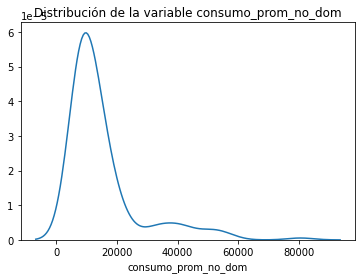

In [142]:
distplot_num(df_test, "consumo_prom_no_dom", 85)